<a href="https://colab.research.google.com/github/vrlnarayana/capstone-gl/blob/main/Capstone_Recommendation_Systems_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Capstone Project : Group 4 : Song Recommendation

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from google.colab import files
from scipy.sparse import csr_matrix
import warnings; warnings.simplefilter('ignore')

# Remove scientific notations and display numbers with 2 decimal points instead
pd.options.display.float_format = '{:,.2f}'.format   

plt.rcParams["figure.figsize"] = [20, 6]  # width, height
plt.rcParams['xtick.direction'] = 'out'

**READ SONG DATA**

In [3]:
song_data=pd.read_csv(r'/content/drive/My Drive/song_data_with_gender.csv')

**READ PLAY COUNT DATA**

In [4]:
count_data=pd.read_csv(r'/content/drive/My Drive/count_data.csv', index_col='Unnamed: 0') #Making unnamed: 0 an index column

**READ IMDb RATING DATA - "Externally Added"**

In [5]:
df_rating_data=pd.read_csv(r'/content/drive/My Drive/rating data.tsv', sep='\t')

**READ IMDb MOVIE TITLES DATA - "Externally Added"**

In [6]:
df_akas_data=pd.read_csv(r'/content/drive/My Drive/akas data.tsv', sep='\t')

**READ musixmatch mxm_779k_matches dataset "Externally Added"**

In [7]:
df_trackid_msd_artist=pd.read_csv(r'/content/drive/My Drive/mxm_779k_matches.txt', sep='<SEP>') # from http://millionsongdataset.com/musixmatch/#getting

**READ tagtraum msd_tagtraum_cd2c dataset "Externally Added"**

In [8]:
df_genre_data=pd.read_csv(r'/content/drive/My Drive/msd_tagtraum_cd2c.cls', sep='\t') #data from https://www.tagtraum.com/msd_genre_datasets.html

In [9]:
song_data.head()

,Unnamed: 0,song_id,title,release,artist_name,year,artist_gender
0,0,SOQMMHC12AB0180CB8,Silent Night,Monster Ballads X-Mas,Faster Pussy cat,2003,male
1,1,SOVFVAK12A8C1350D9,Tanssi vaan,Karkuteillä,Karkkiautomaatti,1995,female
2,2,SOGTUKN12AB017F4F1,No One Could Ever,Butter,Hudson Mohawke,2006,female
3,3,SOBNYVR12A8C13558C,Si Vos Querés,De Culo,Yerba Brava,2003,female
4,4,SOHSBXH12A8C13B0DF,Tangle Of Aspens,Rene Ablaze Presents Winter Sessions,Der Mystic,0,male


In [10]:
count_data.head()

,user_id,song_id,play_count
0,b80344d063b5ccb3212f76538f3d9e43d87dca9e,SOAKIMP12A8C130995,1
1,b80344d063b5ccb3212f76538f3d9e43d87dca9e,SOBBMDR12A8C13253B,2
2,b80344d063b5ccb3212f76538f3d9e43d87dca9e,SOBXHDL12A81C204C0,1
3,b80344d063b5ccb3212f76538f3d9e43d87dca9e,SOBYHAJ12A6701BF1D,1
4,b80344d063b5ccb3212f76538f3d9e43d87dca9e,SODACBL12A8C13C273,1


In [11]:
df_rating_data.head()

,tconst,averageRating,numVotes
0,tt0000001,5.70,1669
1,tt0000002,6.10,207
2,tt0000003,6.50,1392
3,tt0000004,6.20,123
4,tt0000005,6.20,2181


In [12]:
df_akas_data.head()

,titleId,ordering,title,region,language,types,attributes,isOriginalTitle
0,tt0000001,1,Карменсіта,UA,\N,imdbDisplay,\N,0
1,tt0000001,2,Carmencita,DE,\N,\N,literal title,0
2,tt0000001,3,Carmencita - spanyol tánc,HU,\N,imdbDisplay,\N,0
3,tt0000001,4,Καρμενσίτα,GR,\N,imdbDisplay,\N,0
4,tt0000001,5,Карменсита,RU,\N,imdbDisplay,\N,0


**COMMENT:**
millionsongs dataset and IMDb have different indexes/keys and hence we need to analyse and see how to join based on common movie title. If there is no match, we need to find an alternate solution

# Exploratory data Analysis

In [13]:
count_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2000000 entries, 0 to 1999999
Data columns (total 3 columns):
 #   Column      Dtype 
---  ------      ----- 
 0   user_id     object
 1   song_id     object
 2   play_count  int64 
dtypes: int64(1), object(2)
memory usage: 61.0+ MB


In [14]:
song_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 7 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   Unnamed: 0     1000000 non-null  int64 
 1   song_id        1000000 non-null  object
 2   title          999985 non-null   object
 3   release        999995 non-null   object
 4   artist_name    1000000 non-null  object
 5   year           1000000 non-null  int64 
 6   artist_gender  1000000 non-null  object
dtypes: int64(2), object(5)
memory usage: 53.4+ MB


**COMMENTS**
1.   year and paly_count are an int column in song_data and count_data
2.   **15 titles and 5 releases are null values**



In [15]:
rows, columns = count_data.shape
print("No of rows: ", rows) 
print("No of columns: ", columns)

No of rows:  2000000
No of columns:  3


In [16]:
rows, columns = song_data.shape
print("No of rows: ", rows) 
print("No of columns: ", columns)

No of rows:  1000000
No of columns:  7


In [17]:
count_data.describe()

,play_count
count,"2,000,000.00"
mean,3.05
std,6.58
min,1.00
25%,1.00
50%,1.00
75%,3.00
max,"2,213.00"


In [18]:
song_data.describe()

,Unnamed: 0,year
count,"1,000,000.00","1,000,000.00"
mean,"499,999.50","1,030.33"
std,"288,675.28",998.75
min,0.00,0.00
25%,"249,999.75",0.00
50%,"499,999.50","1,969.00"
75%,"749,999.25","2,002.00"
max,"999,999.00","2,011.00"


**COMMENT:**
**Song data has some year values 0, which may not be useful in the analysis**



In [19]:
df_rating_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1108318 entries, 0 to 1108317
Data columns (total 3 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   tconst         1108318 non-null  object 
 1   averageRating  1108318 non-null  float64
 2   numVotes       1108318 non-null  int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 25.4+ MB


In [20]:
df_akas_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24694918 entries, 0 to 24694917
Data columns (total 8 columns):
 #   Column           Dtype 
---  ------           ----- 
 0   titleId          object
 1   ordering         int64 
 2   title            object
 3   region           object
 4   language         object
 5   types            object
 6   attributes       object
 7   isOriginalTitle  object
dtypes: int64(1), object(7)
memory usage: 1.5+ GB


In [21]:
df_rating_data.describe()

,averageRating,numVotes
count,"1,108,318.00","1,108,318.00"
mean,6.88,954.43
std,1.41,"15,983.75"
min,1.00,5.00
25%,6.10,9.00
50%,7.10,20.00
75%,7.90,78.00
max,10.00,"2,326,344.00"


**COMMENTS:**
1.   AverageRating has **rating 1 to 10.**
2.   numVotes shows a **huge SKEW**



In [22]:
song_data.isnull().sum()

Unnamed: 0        0
song_id           0
title            15
release           5
artist_name       0
year              0
artist_gender     0
dtype: int64

**COMMENT**
**In Song data 15 titles and 5 releases are null values**

In [23]:
print('No of unique artists in the data=> ',song_data.artist_name.nunique())

No of unique artists in the data=>  72665


In [24]:
count_data.isnull().sum()

user_id       0
song_id       0
play_count    0
dtype: int64

**COMMENT**
**Play Count data has no null values**

# Checking Duplicates in Song Data

In [25]:
song_data.duplicated().value_counts()

False    1000000
dtype: int64

**COMMENT**
**Song data has 498 duplicates**, we will have treat duplicates before grouping and analysing data

In [26]:
count_data.duplicated().any()

False

**COMMENTS**
**Count data has no duplicates**

In [27]:
# Checking for duplicated rows in song data
song_data[song_data.duplicated()] #Duplicates are 498 in count

,Unnamed: 0,song_id,title,release,artist_name,year,artist_gender


In [28]:
# Checking a sample data
song_data[song_data.song_id=='SOPFBUZ12AF729C896']

,Unnamed: 0,song_id,title,release,artist_name,year,artist_gender
7055,7055,SOPFBUZ12AF729C896,Spitting Games,Final Straw,Snow Patrol,2003,male
18309,18309,SOPFBUZ12AF729C896,Spitting Games,Final Straw,Snow Patrol,2003,male


# Treating Duplicates in Song Data

In [29]:
# DROPPING DUPLICATES in SONG DATA with inplace=True
song_data.drop(song_data[song_data.duplicated()].index, inplace=True)

In [30]:
# CHECKING DUPLICATES AGAIN TO CONFIRM
song_data.duplicated().any()

False

# Checking null values in song title and release column

In [31]:
nan_song_df=song_data[song_data.title.isnull() | song_data.release.isnull()]
nan_song_df

,Unnamed: 0,song_id,title,release,artist_name,year,artist_gender
64262,64262,SOVICLT12A58A7C4D0,NaN,Of Flies And Men,Milton,0,male
114672,114672,SOAGRAA12AB018D567,NaN,Puce de luxe,Sébastien Roch,0,female
138011,138011,SOOBGAQ12A6D4F6762,Solitude,NaN,Metro,0,male
197822,197822,SOGFJER12A6D4F675F,All The Beautiful People,NaN,Metro,0,male
223019,223019,SOAFJBH12A6D4F6765,Down The Aisles,NaN,Metro,0,male
229353,229353,SOOAFJX12AB018A028,NaN,Puce de luxe,Sébastien Roch,0,female
264639,264639,SOLDTFD12AB018AFE6,NaN,Puce de luxe,Sébastien Roch,0,female
458083,458083,SOAUTVB12AB018AFF0,NaN,Puce de luxe,Sébastien Roch,0,female
557125,557125,SOMPGYE12AB018AFE0,NaN,Puce de luxe,Sébastien Roch,0,female
578241,578241,SOVHAZH12AB018D5B3,NaN,Puce de luxe,Sébastien Roch,0,female


**Checking null values in song title and release has any impact on play count data**
**If there is no play count data available for the Null titles and releases then we can ignore them as they will not impact our analysis** 

In [32]:
count_data.song_id.isin(nan_song_df.song_id).value_counts() 

False    2000000
Name: song_id, dtype: int64

**COMMENT:**
value_counts provides a False output which means there is **NO IMPACT** null titles do not have play counts. Hence, **IGNORE THEM NULL TITLES and RELEASES**

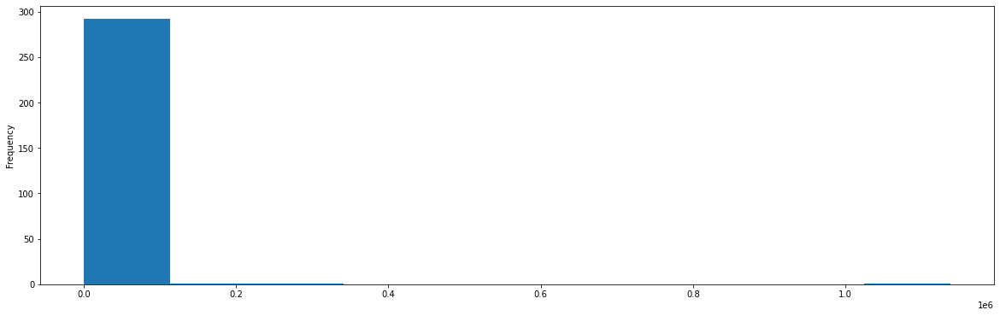

In [33]:
#HIST plot to see the concentration of user play_counts. We can see the count is more in the lower rungs, with an exception of a few in the higher rungs
count_data.play_count.value_counts().plot(bins=10,kind='hist')

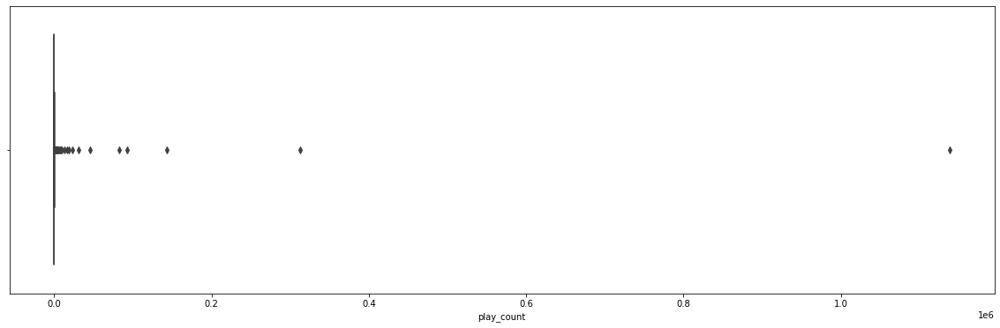

In [34]:
# Confirming the same with boxplot
sns.boxplot(count_data.play_count.value_counts())

# Grouping and Merging DataSets

In [35]:
sorted_play_counts_df=count_data.groupby(['song_id','play_count']).sum().sort_values(by='play_count',ascending=False)
sorted_play_counts_df.reset_index(inplace=True)
sorted_play_counts_df.set_index('song_id', inplace=True)# making song_id index of the df, this is required to merge with song_data df

sorted_play_counts_df # Sorted in descending order of play_count to see the top play counts first


,play_count,user_id
song_id,,
SOFCGSE12AF72A674F,2213,d13609d62db6df876d3cc388225478618bb7b912
SOUAGPQ12A8AE47B3A,920,50996bbabb6f7857bf0c8019435b5246a0e45cfd
SOKOSPK12A8C13C088,879,5ea608df0357ec4fda191cb9316fe8e6e65e3777
SOZQSVB12A8C13C271,796,bb85bb79612e5373ac714fcd4469cabeb5ed94e1
SOBONKR12A58A7A7E0,683,c012ec364329bb08cbe3e62fe76db31f8c5d8ec3
...,...,...
SOPRQRO12AB018906E,1,25fc0200450bbf726c8511fabe31ecfdb81732eb3fd3ac...
SOPROPB12A8C1385BD,1,732f88be38fae217f8ab7e24c20dd072436e3e40b12c78...
SOPROEW12A6D4FD0F7,1,4691b4c353503da2c108e372ff056a9ac847c4d1fb51c7...


In [36]:
songs_play_count_df=pd.merge(sorted_play_counts_df,song_data,on='song_id')

In [37]:
songs_play_count_df

,song_id,play_count,user_id,Unnamed: 0,title,release,artist_name,year,artist_gender
0,SOFCGSE12AF72A674F,2213,d13609d62db6df876d3cc388225478618bb7b912,567847,Starshine,Gorillaz,Gorillaz,2000,male
1,SOFCGSE12AF72A674F,26,a2f4a835133971255b6153bcd3472f2d9c414c1f,567847,Starshine,Gorillaz,Gorillaz,2000,male
2,SOFCGSE12AF72A674F,9,5843a275e43c5de3b77b6c5f0e9d521fadef2560,567847,Starshine,Gorillaz,Gorillaz,2000,male
3,SOFCGSE12AF72A674F,7,d45dadf7dd306b2f17afa48555c8d10cc2be219ed5a8ef...,567847,Starshine,Gorillaz,Gorillaz,2000,male
4,SOFCGSE12AF72A674F,6,d029b50513fe385d6b40b237da1ec0bf8745df6fee4feb...,567847,Starshine,Gorillaz,Gorillaz,2000,male
...,...,...,...,...,...,...,...,...,...
144347,SOSVQPX12A8C14078C,1,7da61f8ef076d56881f244daf7fc92e1f7872d563d7d0b...,561982,Pree-Sisters Swallowing a Donkey's Eye,On Avery Island,Neutral Milk Hotel,1996,male
144348,SOSLEFC12A6D4FC740,2,3d70fa5a6c04cf7fdfc43e73cee80fff24e8bed15cb3fc...,908288,Slan Le Maige,Heroes,Reel Feelings,0,male
144349,SOSLEFC12A6D4FC740,1,5a905f000fc1ff3df7ca807d57edb608863db05d8b0578...,908288,Slan Le Maige,Heroes,Reel Feelings,0,male
144350,SOXDPFW12A81C2319B,2,62c39ebced70b7a604682b8311215af24bf72ede0e5696...,641362,Ribbons,Ringer,Four Tet,2008,male


**COMMENT**
**songs_play_count_df has total rows of 142490 rows afer pd merge**

[Text(0, 0, '0'),
 Text(0, 0, '1954'),
 Text(0, 0, '1955'),
 Text(0, 0, '1956'),
 Text(0, 0, '1957'),
 Text(0, 0, '1958'),
 Text(0, 0, '1959'),
 Text(0, 0, '1960'),
 Text(0, 0, '1961'),
 Text(0, 0, '1962'),
 Text(0, 0, '1963'),
 Text(0, 0, '1964'),
 Text(0, 0, '1965'),
 Text(0, 0, '1966'),
 Text(0, 0, '1967'),
 Text(0, 0, '1968'),
 Text(0, 0, '1969'),
 Text(0, 0, '1970'),
 Text(0, 0, '1971'),
 Text(0, 0, '1972'),
 Text(0, 0, '1973'),
 Text(0, 0, '1974'),
 Text(0, 0, '1975'),
 Text(0, 0, '1976'),
 Text(0, 0, '1977'),
 Text(0, 0, '1978'),
 Text(0, 0, '1979'),
 Text(0, 0, '1980'),
 Text(0, 0, '1981'),
 Text(0, 0, '1982'),
 Text(0, 0, '1983'),
 Text(0, 0, '1984'),
 Text(0, 0, '1985'),
 Text(0, 0, '1986'),
 Text(0, 0, '1987'),
 Text(0, 0, '1988'),
 Text(0, 0, '1989'),
 Text(0, 0, '1990'),
 Text(0, 0, '1991'),
 Text(0, 0, '1992'),
 Text(0, 0, '1993'),
 Text(0, 0, '1994'),
 Text(0, 0, '1995'),
 Text(0, 0, '1996'),
 Text(0, 0, '1997'),
 Text(0, 0, '1998'),
 Text(0, 0, '1999'),
 Text(0, 0, '200

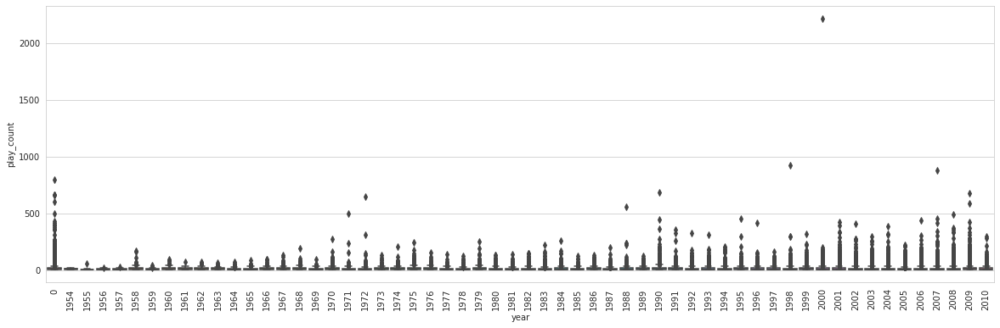

In [38]:
sns.set_style("whitegrid")
ax = sns.boxplot(x="year", y="play_count", data=songs_play_count_df)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

**Sudeep Comment**
From the above Boxplot chart it can be said that the song play count increased from the year 1990 onwards. This may be due to more availability of compact dics & improved internet connection over the years.

In [39]:
# Calculate the minimum number of play counts required to be in the chart, m
m = songs_play_count_df['play_count'].quantile(0.90)
print(m)

28.0


**Sudeep Comment :** 
The number of play counts, m, received by a song in the 90th percentile is coming as 28. So we should consider any songs that have a play count > 28 is a fairly popular song.

In [ ]:
songs_play_count_df.isnull().any() # reconfirming presence of any null values.

song_id          False
play_count       False
user_id          False
Unnamed: 0       False
title            False
release          False
artist_name      False
year             False
artist_gender    False
dtype: bool

**There are no null values**

In [ ]:
songs_play_count_df[songs_play_count_df['song_id']=='SOBONKR12A58A7A7E0']

,song_id,play_count,user_id,Unnamed: 0,title,release,artist_name,year,artist_gender
89,SOBONKR12A58A7A7E0,683,c012ec364329bb08cbe3e62fe76db31f8c5d8ec3,448841,You're The One,If There Was A Way,Dwight Yoakam,1990,male
90,SOBONKR12A58A7A7E0,446,66ff466e107e9bcd7c6f2c59501ed0d7844c26c0,448841,You're The One,If There Was A Way,Dwight Yoakam,1990,male
91,SOBONKR12A58A7A7E0,359,9c82c3083bc78157017cb31de4105e06d3f153f5,448841,You're The One,If There Was A Way,Dwight Yoakam,1990,male
92,SOBONKR12A58A7A7E0,271,6a944bfe30ae8d6b873139e8305ae131f1607d5f,448841,You're The One,If There Was A Way,Dwight Yoakam,1990,male
93,SOBONKR12A58A7A7E0,225,a0b5dcfe540fc177349d6f6063099bab8cd16da9,448841,You're The One,If There Was A Way,Dwight Yoakam,1990,male
...,...,...,...,...,...,...,...,...,...
199,SOBONKR12A58A7A7E0,5,3f9ed694a79835c921ef6d94acd28f876c1d901e8bc273...,448841,You're The One,If There Was A Way,Dwight Yoakam,1990,male
200,SOBONKR12A58A7A7E0,4,179b2286bb4eea7193bcfa0c36fcfa4eade2b34d766103...,448841,You're The One,If There Was A Way,Dwight Yoakam,1990,male
201,SOBONKR12A58A7A7E0,3,be0a4b64e9689c46e94b5a9a9c7910ee61aeb16ffd585a...,448841,You're The One,If There Was A Way,Dwight Yoakam,1990,male
202,SOBONKR12A58A7A7E0,2,e006b1a48f466bf59feefed32bec6494495a44362b6c2f...,448841,You're The One,If There Was A Way,Dwight Yoakam,1990,male


**COMMENT:**
specific song_id = **SOFCGSE12AF72A674F** show that a user_id = **d13609d62db6df876d3cc388225478618bb7b912** has played it 2213 times, must be a crazy listner as the next best is only 26

In [ ]:
# Release'wise sorted play count (Top 10)
release_play_count_df=songs_play_count_df[['release','play_count']].groupby('release').sum().sort_values(by='play_count',ascending=False)[:10]
release_play_count_df

,play_count
release,
Greatest Hits,15126
Only By The Night,9620
If There Was A Way,9224
My Worlds,7605
Fallen,7122
Vespertine Live,6225
Fat Come Back,5149
Fearless,4872
Waking Up,4678


In [ ]:
# Artist'wise play count top 10
artist_play_count_df=songs_play_count_df[['artist_name','play_count']].groupby('artist_name').sum().sort_values(by='play_count',ascending=False)[:10]
artist_play_count_df

,play_count
artist_name,
Kings Of Leon,13888
The Black Keys,12408
Muse,12092
Coldplay,11777
Jack Johnson,10192
Taylor Swift,9601
Justin Bieber,9448
Evanescence,9253
Dwight Yoakam,9224


In [ ]:
# artist and release 'wise top 10
artist_release_play_count_df=songs_play_count_df[['artist_name','release','play_count']].groupby(['artist_name','release']).sum().sort_values(by='play_count',ascending=False)[:10]
artist_release_play_count_df

,,play_count
artist_name,release,
Kings Of Leon,Only By The Night,9620
Dwight Yoakam,If There Was A Way,9224
Evanescence,Fallen,7122
Justin Bieber,My Worlds,6807
Björk,Vespertine Live,6225
Alliance Ethnik,Fat Come Back,5149
OneRepublic,Waking Up,4678
Florence + The Machine,Lungs,4643
Taylor Swift,Fearless,4510


# Filtering songs data based on top play counts

In [ ]:
top_count_data=count_data[count_data.play_count>20] # considering play_count greater than 20

In [ ]:
print('The number of observations in top_count_data =', len(top_count_data))
print('Number of unique USERS in top_count_data = ', top_count_data['user_id'].nunique())
print('Number of unique SONGS in top_count_data = ', top_count_data['song_id'].nunique())

The number of observations in top_count_data = 31141
Number of unique USERS in top_count_data =  13581
Number of unique SONGS in top_count_data =  6599


# Popularity based recommendation

In [ ]:
popular_song_df = top_count_data.groupby('song_id').play_count.agg(['sum']).sort_values(by='sum',ascending=False)
popular_song_df.head(10) #Popularity based top 10 songs played. 
 # TO be discussed with Lakshminaryanan

,sum
song_id,
SOBONKR12A58A7A7E0,27776
SOAUWYT12A81C206F1,21616
SOSXLTC12AF72A7F54,19225
SOEGIYH12A6D4FC0E3,12571
SOUFTBI12AB0183F65,9483
SOVDSJC12A58A7A271,8299
SOPUCYA12A8C13A694,7814
SOOFYTN12A6D4F9B35,7590
SOHTKMO12AB01843B0,6522


In [ ]:
# Making a dataframe where we have summation of times song is played in general and played by distincet users i.e count_play_count.(Number of times we have play_count for the users)
sum_play_count = songs_play_count_df.groupby('song_id').sum()['play_count']
count_play_count = songs_play_count_df.groupby('song_id').count()['play_count']
final_play_count=pd.DataFrame({'sum_play_count':sum_play_count,'count_play_count':count_play_count})

In [ ]:
final_play_count.sort_values(by='count_play_count', ascending=False)

,sum_play_count,count_play_count
song_id,,
SOBONKR12A58A7A7E0,9224,115
SOSXLTC12AF72A7F54,8153,107
SOAUWYT12A81C206F1,6097,100
SOJRFWQ12AB0183582,3861,96
SOEGIYH12A6D4FC0E3,4397,87
...,...,...
SOYYYFE12A81C2395E,6,3
SOBDQMB12AB0189045,6,3
SOPJWVJ12A6D4FA182,6,3


In [ ]:
#defining a function to get the top n songs based on highest times a song is played in general and some minimum interactions (minimum number of distinct users or we can say play count) of that song
def top_n_songs(final_play_count, n, min_interaction=50):
    recommendations=final_play_count[final_play_count['count_play_count']>min_interaction]
    recommendations=recommendations.sort_values(by='sum_play_count', ascending=False)
    return recommendations.index[:n]

In [ ]:
# Top 5 songs based on atleast 50 interactions between users and the song. 
top_pop_songs_id=list(top_n_songs(final_play_count, 10, 50))
top_pop_songs_id

['SOBONKR12A58A7A7E0',
 'SOSXLTC12AF72A7F54',
 'SOAUWYT12A81C206F1',
 'SOVDSJC12A58A7A271',
 'SOEGIYH12A6D4FC0E3',
 'SOUFTBI12AB0183F65',
 'SOJRFWQ12AB0183582',
 'SOOFYTN12A6D4F9B35',
 'SOTCMDJ12A6D4F8528',
 'SOUDLVN12AAFF43658']

In [ ]:
song_data[song_data.song_id.isin(top_pop_songs_id)].set_index('song_id').title

song_id
SOAUWYT12A81C206F1                                                 Undo
SOOFYTN12A6D4F9B35                                           Représente
SOVDSJC12A58A7A271                                     Ain't Misbehavin
SOJRFWQ12AB0183582                                         Dance_ Dance
SOTCMDJ12A6D4F8528                                             The Gift
SOUFTBI12AB0183F65                                              Invalid
SOBONKR12A58A7A7E0                                       You're The One
SOEGIYH12A6D4FC0E3    Horn Concerto No. 4 in E flat K495: II. Romanc...
SOUDLVN12AAFF43658                               Make Love To Your Mind
SOJRFWQ12AB0183582                                         Dance_ Dance
SOSXLTC12AF72A7F54                                              Revelry
SOJRFWQ12AB0183582                                         Dance_ Dance
Name: title, dtype: object

In [ ]:
#code for getting titles instead of song_ids
choices=np.unique(song_data[song_data.song_id.isin(top_pop_songs_id)].title.values)+' by '+np.unique(song_data[song_data.song_id.isin(top_pop_songs_id)].artist_name.values)

In [ ]:
choices,len(choices)

(array(["Ain't Misbehavin by Alliance Ethnik",
        'Dance_ Dance by Angels and Airwaves',
        'Horn Concerto No. 4 in E flat K495: II. Romance (Andante cantabile) by Barry Tuckwell/Academy of St Martin-in-the-Fields/Sir Neville Marriner',
        'Invalid by Bill Withers', 'Make Love To Your Mind by Björk',
        'Représente by Dwight Yoakam', 'Revelry by Fall Out Boy',
        'The Gift by Kings Of Leon', 'Undo by Sam Cooke',
        "You're The One by Tub Ring"], dtype=object), 10)

# Collaborative filtering based recommendation

**Interaction Matrix - play_count_data**

In [ ]:
play_count_data_matrix = top_count_data.pivot(index='user_id', columns='song_id', values='play_count').fillna(0)
play_count_data_matrix

song_id,SOAAAGQ12A8C1420C8,SOAACPJ12A81C21360,SOAACSG12AB018DC80,SOAAFAC12A67ADF7EB,SOAAFYH12A8C13717A,SOAAKPM12A58A77210,SOAALWN12A6D4F7FDA,SOAAOYI12AB01831CE,SOAAROC12A6D4FA420,SOAATLI12A8C13E319,SOAAUKC12AB017F868,SOAAVUV12AB0186646,SOAAWEE12A6D4FBEC8,SOABHNP12A8AE46E82,SOABHYV12A6D4F6D0F,SOABJBU12A8C13F63F,SOABJTC12A58A7DE0E,SOABNLP12A6D4F87F4,SOABNPW12A6D4FC9B5,SOABOHM12AB018509C,SOABOXV12AC3DF82F7,SOABQTG12A6701F3DB,SOABTTR12A6D4FC2EB,SOABXNE12A8C13B818,SOACBLB12AB01871C7,SOACIPG12A8AE47E1C,SOACKIA12A6D4F73D7,SOACMJJ12A6D4FC66A,SOACNQJ12A8C13B09E,SOACPSU12A81C231EF,SOACYUL12A6D4F9C79,SOADELR12AB0181A6D,SOADISH12AB018DFAC,SOADJGO12AB0185D5B,SOADJQJ12A8C141D38,SOADMBB12AB017C0F1,SOADMKP12A8C13BAA4,SOADMTV12A6701FA3F,SOADOQJ12A8AE45C7E,SOADQMO12A8C136FF9,...,SOZVCRW12A67ADA0B7,SOZVSSP12AB01819DE,SOZVTFB12AF729FEAA,SOZVUCT12A8C1424BE,SOZVVMJ12A58A7C548,SOZVVRE12A8C143150,SOZVYSU12A6310F227,SOZVZSP12A6D4F6A99,SOZWBVE12AAF3B515C,SOZWDQN12AB0182A85,SOZWJEP12A6310E1F5,SOZWLHR12A8C13F211,SOZWMNZ12A6D4FCD0D,SOZWNXK12AF729D82B,SOZWQWC12AF72AAA2C,SOZWVZW12AF72A0E04,SOZWWTF12A8C1408E2,SOZXBVL12AB0184D35,SOZXHNM12AB017CDEA,SOZXHRP12A6D4F9A2C,SOZXHYA12A8C145274,SOZXKIA12A6D4F861C,SOZXLPJ12A6701F7AB,SOZXMYX12AB018A445,SOZXTAI12A8C134DE1,SOZXTUT12A6D4F6D03,SOZXVWK12AB018B865,SOZYDZR12A8C13F4F0,SOZYIQR12A58A7DB25,SOZYPRF12A6310F1B4,SOZYSDT12A8C13BFD7,SOZYUGZ12A8AE472AC,SOZYUXF12A6701F7B9,SOZZHQT12AB018B714,SOZZKPR12A6D4F8147,SOZZLTY12A67AE0AD0,SOZZLZN12A8AE48D6D,SOZZTCU12AB0182C58,SOZZTNF12A8C139916,SOZZWZV12A67AE140F
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00125672fad06bc57f5a4304cceea9effab07839,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
0013e651c18f10396ad1125d5d1c894b0224bb1f,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
0021d9a4628624f6d70237f9c200ab82e766bf26,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
0022c3932761ce91d8a034318402cfb63224f894,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
002543003041db1d049206b09426d5cdffc0f451,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
available_play_counts = np.count_nonzero(play_count_data_matrix)
print('available_play_counts = ', available_play_counts)
possible_num_of_play_counts = play_count_data_matrix.shape[0] * play_count_data_matrix.shape[1]
print('possible_num_of_play_counts = ', possible_num_of_play_counts)
density = (available_play_counts/possible_num_of_play_counts)
density *= 100
print ('density: {:4.2f}%'.format(density))

available_play_counts =  31141
possible_num_of_play_counts =  89621019
density: 0.03%


**COMMENT:**
**Density is low, means data is sparse**

# Merge IMDb with Song Data

In [ ]:
imdb_merge=pd.merge(df_akas_data,df_rating_data,left_on='titleId',right_on='tconst')

**COMMENT:**
IMDb song titles and IMDb ratings data merged

In [ ]:
imdb_merge=imdb_merge[imdb_merge.ordering==1] #filtering further to remove duplicate titles

In [ ]:
imdb_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 832707 entries, 0 to 3048144
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   titleId          832707 non-null  object 
 1   ordering         832707 non-null  int64  
 2   title            832707 non-null  object 
 3   region           832694 non-null  object 
 4   language         832707 non-null  object 
 5   types            832707 non-null  object 
 6   attributes       832707 non-null  object 
 7   isOriginalTitle  832707 non-null  object 
 8   tconst           832707 non-null  object 
 9   averageRating    832707 non-null  float64
 10  numVotes         832707 non-null  int64  
dtypes: float64(1), int64(2), object(8)
memory usage: 76.2+ MB


In [ ]:
imdb_merge[imdb_merge.title=='Silent Night'] #Silent Night, Carmencita, Tomorrow Is Ours

,titleId,ordering,title,region,language,types,attributes,isOriginalTitle,tconst,averageRating,numVotes
848977,tt0138427,1,Silent Night,DE,\N,\N,\N,0,tt0138427,7.10,149
1335463,tt0457474,1,Silent Night,US,\N,\N,\N,0,tt0457474,7.40,31
1388489,tt0511712,1,Silent Night,US,\N,\N,\N,0,tt0511712,8.60,14
1539708,tt0824401,1,Silent Night,XWW,en,\N,\N,0,tt0824401,5.60,12
1596299,tt0915979,1,Silent Night,GB,\N,\N,\N,0,tt0915979,9.60,7
1763592,tt1131980,1,Silent Night,AU,\N,\N,\N,0,tt1131980,8.40,27
1862463,tt1256286,1,Silent Night,US,\N,\N,\N,0,tt1256286,7.90,612
2195436,tt2098189,1,Silent Night,CA,\N,\N,\N,0,tt2098189,8.00,381
2233784,tt2234417,1,Silent Night,AU,\N,\N,\N,0,tt2234417,7.80,6
2239939,tt2254133,1,Silent Night,\N,\N,original,\N,1,tt2254133,6.80,5


In [ ]:
song_imdb_merge=pd.merge(songs_play_count_df,imdb_merge,left_on='title',right_on='title') #Song data and IMDb rating data merged

In [ ]:
song_imdb_merge.set_index('song_id',inplace=True) #Song data and IMDb rating data merged

**COMMENT:**
ABOVE DATA song_imdb_merge is of different regions and hence to get universal rating we can do an average of all regions and sum of numVotes

# Popularity of Songs based on rating and numVotes

In [ ]:
#Top 10 averageRating across all regions (without filtering based on numVotes)
song_imdb_merge.groupby(['song_id','title','release'])['averageRating'].agg(['mean','count']).sort_values(by='count',ascending=False)[:10] 

,,,mean,count
song_id,title,release,,
SOTCMDJ12A6D4F8528,The Gift,We Don't Need To Whisper,7.38,5616
SOTVLQY12A58A798C2,Home,Up From Below,7.46,3939
SONYKOW12AB01849C9,Secrets,Waking Up,7.10,2332
SOIYWPZ12A81C204EF,Homecoming,Graduation,7.55,2024
SOWWNDT12A8AE49A4C,Home,Daughtry (Deluxe Edition),7.46,2020
SOIJAMG12A8AE47E21,Home,Three Days Grace (Deluxe Version),7.46,1515
SOXOEUD12AB018CF4C,Home,This Is Happening,7.46,1212
SOEYVHS12AB0181D31,Monster,The Fame Monster,7.16,1036
SOHXWUX12AB01821DC,Silence,Clubbers Guide 2009,6.76,961


In [ ]:
avg_rating = song_imdb_merge.groupby(['song_id','title','release']).sum()['averageRating']
rating_count = song_imdb_merge.groupby(['song_id','title','release']).count()['averageRating']
final_rating = pd.DataFrame({'avg_rating': avg_rating, 'rating_count': rating_count})

In [ ]:
def top_rated_n_songs(song_imdb_merge, n, min_interaction=20):
    recommendations=song_imdb_merge[song_imdb_merge['numVotes']>min_interaction]
    recommendations=recommendations.sort_values(by='averageRating', ascending=False)
    return recommendations.index[:n]

In [ ]:
top_rated_n_songs(song_imdb_merge,5)

Index(['SONUSLR12A5891DCCB', 'SONUSLR12A5891DCCB', 'SOTVLQY12A58A798C2',
       'SOWWNDT12A8AE49A4C', 'SOIJAMG12A8AE47E21'],
      dtype='object', name='song_id')

In [ ]:
song_imdb_merge[song_imdb_merge['numVotes']>20]

,play_count,user_id,Unnamed: 0,title,release,artist_name,year,artist_gender,titleId,ordering,region,language,types,attributes,isOriginalTitle,tconst,averageRating,numVotes
song_id,,,,,,,,,,,,,,,,,,
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0074041,1,US,\N,\N,\N,0,tt0074041,7.20,176
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0117420,1,AU,\N,imdbDisplay,\N,0,tt0117420,5.60,24134
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0316462,1,GB,\N,\N,\N,0,tt0316462,7.80,71
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0529800,1,US,\N,\N,\N,0,tt0529800,7.50,72
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0553467,1,US,\N,\N,\N,0,tt0553467,7.20,84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SOLYVPG12AB0185318,3,4be8732ad47ad1302dc16f8c30dbb14c138bfb366564c4...,977523,Sympathy,One Beat,Sleater-kinney,2002,female,tt1017461,1,\N,\N,original,\N,1,tt1017461,5.00,360
SOLYVPG12AB0185318,2,ee03697dfdf668a9cd19a44a6f257b9d6a1dc60a3b8479...,977523,Sympathy,One Beat,Sleater-kinney,2002,female,tt1017461,1,\N,\N,original,\N,1,tt1017461,5.00,360
SOLYVPG12AB0185318,1,baf47ed8da24d607e50d8684cde78b923538640fe3937c...,977523,Sympathy,One Beat,Sleater-kinney,2002,female,tt1017461,1,\N,\N,original,\N,1,tt1017461,5.00,360


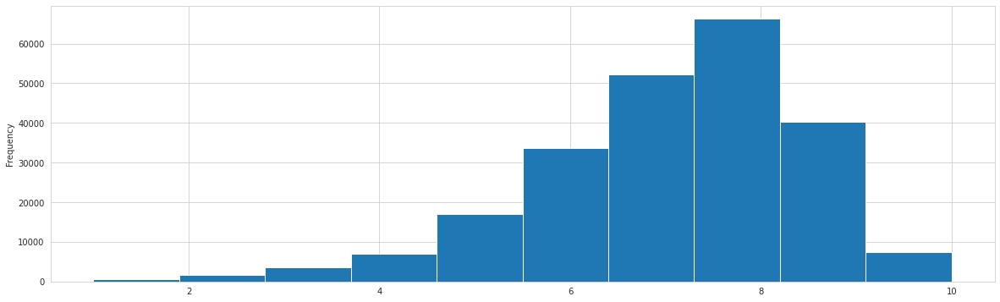

In [ ]:
song_imdb_merge.averageRating.plot(kind='hist') #most of the rating has happened in the range of 6 to 9 and hence, we can take averageRating greater than 5

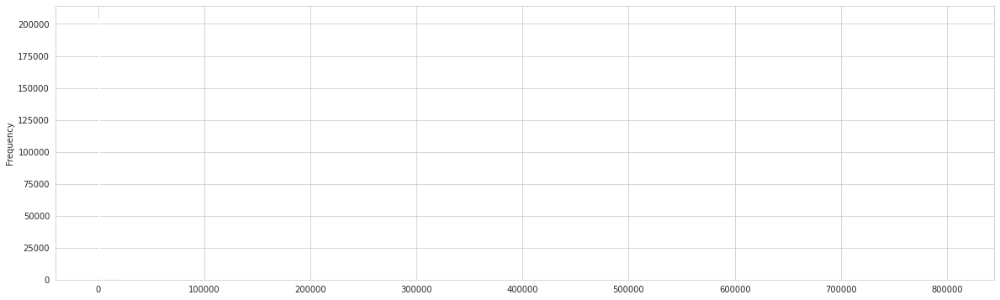

In [ ]:
song_imdb_merge.numVotes.plot(bins=1000,kind='hist') # This means there are 800 data points within every bin (total no of bins=1000=no of rows in the dataset)
# What we see here is, the peak is in the first few bins, plotly express below will give a clear view

In [ ]:
fig = px.histogram(song_imdb_merge,x=song_imdb_merge.numVotes,nbins=100000,title='Plot Frequency')
fig.show()
#in IMDb Voting, rating dataset for the matching songs in MillionSongs Dataset significant no of votes are in this range
#192K counts in 0-499 Votes -> 0-99 Votes has 152K counts -> 100-199 Votes has 18.12K counts
#12.6K counts in 500-999 Votes
#
#So this means, we should consider numVotes < 1000 for filtering

In [ ]:
#numVotes distribution across songs
fig1 = px.line(song_imdb_merge,x=song_imdb_merge.index,y='numVotes',title='Plot Frequency')
fig1.show()

In [ ]:
#playcount distribution across songs
fig2 = px.line(song_imdb_merge,x=song_imdb_merge.index,y='play_count',title='Plot Frequency')
fig2.show()

In [ ]:
#histogram distribution across songs
fig3 = px.histogram(song_imdb_merge,x=song_imdb_merge.play_count,nbins=1000,title='Plot Frequency')
fig3.show()

In [ ]:
song_imdb_merge

,play_count,user_id,Unnamed: 0,title,release,artist_name,year,artist_gender,titleId,ordering,region,language,types,attributes,isOriginalTitle,tconst,averageRating,numVotes
song_id,,,,,,,,,,,,,,,,,,
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0005939,1,US,\N,\N,\N,0,tt0005939,5.10,15
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0074041,1,US,\N,\N,\N,0,tt0074041,7.20,176
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0117420,1,AU,\N,imdbDisplay,\N,0,tt0117420,5.60,24134
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0316462,1,GB,\N,\N,\N,0,tt0316462,7.80,71
SOZPMJT12AAF3B40D1,585,f1bdbb9fb7399b402a09fa124210dedf78e76034,577438,The Quest,A Taste Of Extreme Divinity,HYPOCRISY,2009,female,tt0450485,1,US,\N,\N,\N,0,tt0450485,8.80,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SOXDPFW12A81C2319B,2,62c39ebced70b7a604682b8311215af24bf72ede0e5696...,641362,Ribbons,Ringer,Four Tet,2008,male,tt4581734,1,US,\N,\N,\N,0,tt4581734,6.10,31
SOXDPFW12A81C2319B,2,62c39ebced70b7a604682b8311215af24bf72ede0e5696...,641362,Ribbons,Ringer,Four Tet,2008,male,tt5192312,1,US,\N,\N,\N,0,tt5192312,6.90,7
SOXDPFW12A81C2319B,1,176e3f8a0eb8bb540a0e731230fdea7147c357da17c51e...,641362,Ribbons,Ringer,Four Tet,2008,male,tt1730339,1,US,\N,\N,\N,0,tt1730339,6.70,9


In [ ]:
# Simulation of above histogram through code
cnt=[]
song_imdb_merge1=song_imdb_merge.reset_index()
playcnt=[10,20,30,40,50,60,70,80,90,100,150,200,300,400,500,1000]
for i in range(len(playcnt)):
  cnt.append(song_imdb_merge1.reset_index()[(song_imdb_merge1.play_count>playcnt[i]-playcnt[i-1])&(song_imdb_merge1.play_count<playcnt[i])].count()['song_id'])

dfplaycnt=pd.DataFrame({'playcount':playcnt,'counts':cnt}).set_index('playcount')
dfplaycnt

,counts
playcount,
10,122743
20,49886
30,72405
40,83036
50,87691
60,90833
70,92485
80,93831
90,94697


In [ ]:
fig4 = px.line(dfplaycnt,x=dfplaycnt.index,y='counts',title='Plot playcounts bin')
fig4.show()
#This shows interesing graph playcount 20 DIPS drastically that means we can consider play_count>20 

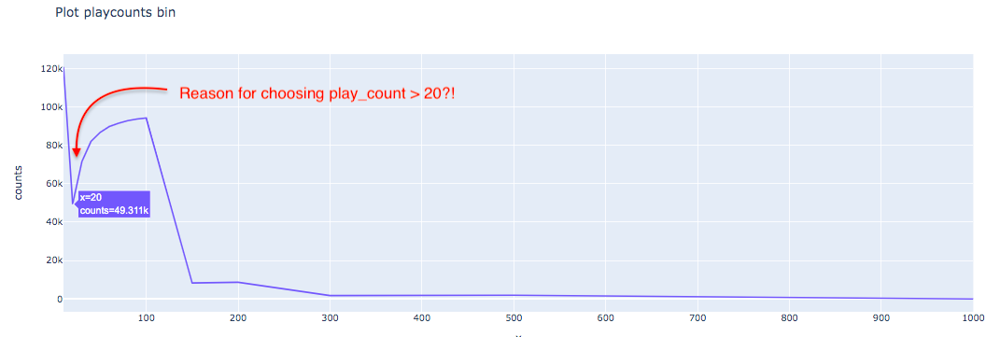

In [ ]:
# Simulation of above histogram through code for numVotes
cnt=[]
numvotes=[10,20,30,40,50,60,70,80,90,100,150,200,300,400,500,1000,10000,100000,200000,300000,500000,800000,1000000]
for i in range(len(numvotes)):
  cnt.append(song_imdb_merge1[(song_imdb_merge1.numVotes>numvotes[i]-numvotes[i-1])&(song_imdb_merge1.numVotes<numvotes[i])].count()['song_id'])

dfnumvotes=pd.DataFrame({'numvotes':numvotes,'counts':cnt}).set_index('numvotes')
dfnumvotes

,counts
numvotes,
10,53032
20,35592
30,54799
40,65910
50,73209
60,80357
70,86291
80,91229
90,94884


In [ ]:
fig5 = px.line(dfnumvotes,x=dfnumvotes.index,y='counts',title='Plot numVotes bin')
fig5.show()
#This shows interesting graph of IMDb rating->numVotes graph watch bins 10 to 1000, numVotes peaks at 100th bin with 96.7K counts. 
#numVotes is “No of votes garnered by the title”

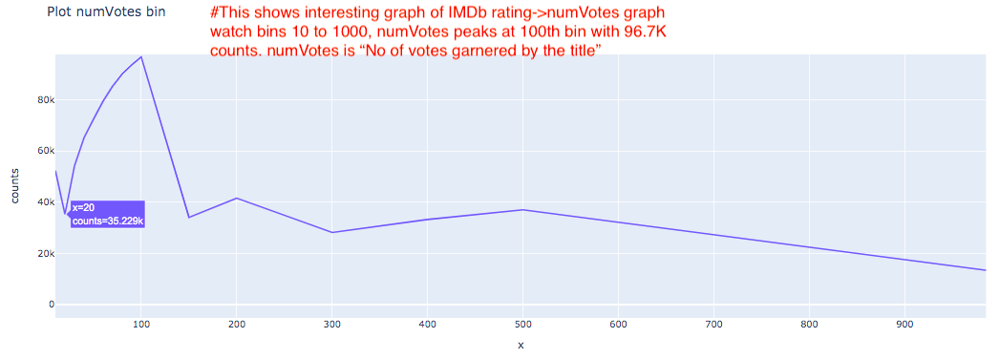

In [ ]:
df_trackid_msd_artist

,tid,artist name,title,mxm tid,artist_name,title.1
0,TRMMMKD128F425225D,Karkkiautomaatti,Tanssi vaan,4418550,Karkkiautomaatti,Tanssi vaan
1,TRMMMRX128F93187D9,Hudson Mohawke,No One Could Ever,8898149,Hudson Mohawke,No One Could Ever
2,TRMMMCH128F425532C,Yerba Brava,Si Vos Querés,9239868,Yerba Brava,Si vos queres
3,TRMMMXN128F42936A5,David Montgomery,"Symphony No. 1 G minor ""Sinfonie Serieuse""/All...",5346741,Franz Berwald,"Symphony No. 1 in G minor ""Sinfonie Sérieuse"":..."
4,TRMMMBB12903CB7D21,Kris Kross,2 Da Beat Ch'yall,2511405,Kris Kross,2 Da Beat Ch'yall
...,...,...,...,...,...,...
779051,TRYYYZM128F428E804,SKYCLAD,Inequality Street,788003,Skyclad,Inequality Street
779052,TRYYYON128F932585A,Loose Shus,Taurus (Keenhouse Remix),8564800,Loose Shus,Red Sonja
779053,TRYYYUS12903CD2DF0,Kiko Navarro,O Samba Da Vida,8472838,Kiko Navarro,A Samba Da Vida
779054,TRYYYMG128F4260ECA,Gabriel Le Mar,Novemba,1997445,Gabriel Le Mar,140 Degrees


**COMMENT:**
df_trackid_msd_artist has 779K rowswith trackID and artist, title mapping

In [ ]:
df_genre_data

,track_id,genre
0,TRAAAAK128F9318786,Rock
1,TRAAAAW128F429D538,Rap
2,TRAAADJ128F4287B47,Rock
3,TRAAADZ128F9348C2E,Latin
4,TRAAAED128E0783FAB,Jazz
...,...,...
191396,TRZZZMY128F426D7A2,Reggae
191397,TRZZZRJ128F42819AF,Rock
191398,TRZZZUK128F92E3C60,Folk
191399,TRZZZZD128F4236844,Rock


**COMMENT:**
df_genre_data has 191K rows with track_ID and genre data which can be mapped with df_trackid_msd_artist to get genre mapping to MSD

In [ ]:
df_genre_data.track_id.isin(df_trackid_msd_artist.tid).value_counts()


True     183891
False      7510
Name: track_id, dtype: int64

**COMMENT:**
There are only 183K rows available with genre data rest of genre will be empty

In [ ]:
genre_final=pd.merge(df_trackid_msd_artist,df_genre_data,left_on='tid', right_on='track_id') # merge df_trackid_msd_artist and df_genre_data
genre_final.drop(columns=['mxm tid','track_id','artist name','title.1'],inplace=True)
genre_final

,tid,title,artist_name,genre
0,TRMMMXJ12903CBF111,El hijo del pueblo,Jorge Negrete,Latin
1,TRMMMXI128F4285A3F,N Gana,Waldemar Bastos,World
2,TRMMMKI128F931D80D,006,Lena Philipsson,Pop
3,TRMMMTK128F424EF7C,Rock-N-Rule,Emery,Rock
4,TRMMMRZ128F4265EB4,I'm Ready,Aerosmith,Rock
...,...,...,...,...
183886,TRYYYOU128F426B209,Interrotte Speranze,Coronatus,Metal
183887,TRYYYWX128F92E11D1,Wouldn't Get Far,The Game,Rap
183888,TRYYYHG128F9343EFB,Chill,Jazz Addixx,Rap
183889,TRYYYYS12903D0605A,Way Down,Taylor Hawkins & The Coattail Riders,Rock


# SONG DATA WITH GENRE

In [ ]:
song_data_with_genre=pd.merge(genre_final,song_data,on=['title','artist_name'])
song_data_with_genre # SONG DATAFRAME WITH GENRE 185K ROWS

,tid,title,artist_name,genre,Unnamed: 0,song_id,release,year,artist_gender
0,TRMMMXJ12903CBF111,El hijo del pueblo,Jorge Negrete,Latin,11,SOLJTLX12AB01890ED,32 Grandes Éxitos CD 2,1997,female
1,TRMMMXI128F4285A3F,N Gana,Waldemar Bastos,World,14,SOGPCJI12A8C13CCA0,Afropea 3 - Telling Stories To The Sea,0,male
2,TRMMMKI128F931D80D,006,Lena Philipsson,Pop,15,SOSDCFG12AB0184647,Lena 20 År,1998,male
3,TRMMMTK128F424EF7C,Rock-N-Rule,Emery,Rock,18,SOIMMJJ12AF72AD643,I'm Only A Man (Bonus Track Version),2007,female
4,TRMMMRZ128F4265EB4,I'm Ready,Aerosmith,Rock,26,SOEEHEY12CF5F88FB4,Honkin' On Bobo,2004,female
...,...,...,...,...,...,...,...,...,...
185179,TRYYYOU128F426B209,Interrotte Speranze,Coronatus,Metal,999984,SOIQNVK12A8C13B061,Lux Noctis,2007,male
185180,TRYYYWX128F92E11D1,Wouldn't Get Far,The Game,Rap,363768,SOQDFGV12AB0183F25,R&B Collaborations 2007,0,female
185181,TRYYYWX128F92E11D1,Wouldn't Get Far,The Game,Rap,999988,SOYKHSL12AF72A35AC,Wouldn't Get Far,0,female
185182,TRYYYHG128F9343EFB,Chill,Jazz Addixx,Rap,999989,SOIDAMG12AB0182B3A,Oxygen Refreshed (Instrumentals),0,female


In [ ]:
song_data_with_genre[song_data_with_genre.title=='Intro'] #CHECKING SPECIFICALLY ONE TITLE TO CHECK DUPLICATES. FIND NO ISSUES

,tid,title,artist_name,genre,Unnamed: 0,song_id,release,year,artist_gender
428,TRMWDJV128F42A3B15,Intro,Kool Savas & Azad,Rap,2721,SOGGXNU12A8C13E437,ONE,2005,male
1399,TRMRPKX128F932574E,Intro,Guts,Electronic,8224,SORTVZZ12AB018100F,Le Bienheureux,2007,male
1530,TRMRYPM12903CE17E0,Intro,Sabbat,Metal,8880,SOUDXIE12AB0188DC3,History Of A Time To Come,1988,male
2388,TRMQKJI128E0789035,Intro,Gorillaz,Rock,13298,SOUHXII12A67021873,Demon Days,2005,male
5928,TRMOFHL128F93233F7,Intro,Red,Rock,33272,SONIQSQ12AB01846A6,Too Hot,0,male
...,...,...,...,...,...,...,...,...,...
179596,TRKYKHX128E07861AA,Intro,Jay-Z,Rap,961567,SOLVAOU12A6702037D,The Dynasty,2000,female
180227,TRYGSMN128F14792E9,Intro,Ruoska,Metal,965865,SOTPEEC12A6D4F7330,Amortem,2006,female
180813,TRYRQYT12903CF2550,Intro,Diecast,Metal,969726,SOWLSER12A6D4FAC87,Day Of Reckoning,2001,male
184057,TRYVVNT128F42AE8C3,Intro,Chris Brown,RnB,992323,SOUZWGN12A58A7F591,Chris Brown,0,male


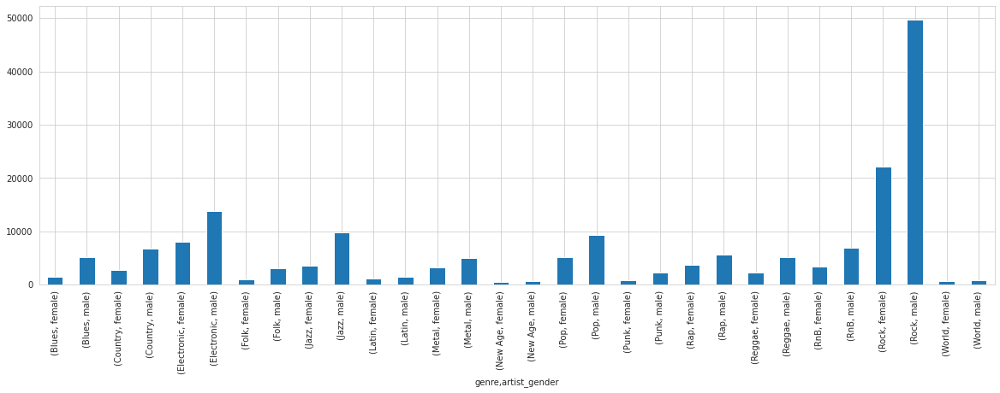

In [ ]:
song_data_with_genre.groupby(['genre','artist_gender'])['song_id'].agg('count').plot(kind='bar')
#Gender on artist name is actually a QUESTION MARK as the data set does not contain proper names in artist_names, we find band names too in artist names.

**COMMENT:**


> There are considerable no of ROCK genre artists in both gender.


> Least in both gender in New Age genre


> We can do genre and gender'wise recommendation using this data







# Content Based Filtering

In content based recommendation system, we would be using these parameters to recommend a song

- Artist Name
- Gender
- Release

Text data generally is very noisy i.e. present pronunciation, stopwords, non-ascii characters makes it very noisy. So we will first need to pre-process the text. And then we will generate features from the text to compute similarities between the texts/reviews.
